<a href="https://colab.research.google.com/github/Monishraj50/TSF_Intern/blob/master/Task5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **TASK 5**
#*Exploratory Data Analysis*
Performing the exploratory data analysis on the provided dataset

**Importing Libraries**

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Downloading json file for visualizing the choropleth maps

In [3]:
!wget --quiet  https://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_500k.json -O us1.json

**Reading Data**

In [4]:
data =pd.read_csv('/content/drive/My Drive/SampleSuperstore.csv')
data.head()

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.9600,2,0.00,41.9136
1,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Chairs,731.9400,3,0.00,219.5820
2,Second Class,Corporate,United States,Los Angeles,California,90036,West,Office Supplies,Labels,14.6200,2,0.00,6.8714
3,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.5775,5,0.45,-383.0310
4,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.3680,2,0.20,2.5164


# Data Preprocessing

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Ship Mode     9994 non-null   object 
 1   Segment       9994 non-null   object 
 2   Country       9994 non-null   object 
 3   City          9994 non-null   object 
 4   State         9994 non-null   object 
 5   Postal Code   9994 non-null   int64  
 6   Region        9994 non-null   object 
 7   Category      9994 non-null   object 
 8   Sub-Category  9994 non-null   object 
 9   Sales         9994 non-null   float64
 10  Quantity      9994 non-null   int64  
 11  Discount      9994 non-null   float64
 12  Profit        9994 non-null   float64
dtypes: float64(3), int64(2), object(8)
memory usage: 1015.1+ KB


In [6]:
data.describe(include='all')

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
count,9994,9994,9994,9994,9994,9994.000000,9994,9994,9994,9994.000000,9994.000000,9994.000000,9994.000000
unique,4,3,1,531,49,NaN,4,3,17,NaN,NaN,NaN,NaN
top,Standard Class,Consumer,United States,New York City,California,NaN,West,Office Supplies,Binders,NaN,NaN,NaN,NaN
freq,5968,5191,9994,915,2001,NaN,3203,6026,1523,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,55190.379428,NaN,NaN,NaN,229.858001,3.789574,0.156203,28.656896
std,NaN,NaN,NaN,NaN,NaN,32063.693350,NaN,NaN,NaN,623.245101,2.225110,0.206452,234.260108
min,NaN,NaN,NaN,NaN,NaN,1040.000000,NaN,NaN,NaN,0.444000,1.000000,0.000000,-6599.978000
25%,NaN,NaN,NaN,NaN,NaN,23223.000000,NaN,NaN,NaN,17.280000,2.000000,0.000000,1.728750
50%,NaN,NaN,NaN,NaN,NaN,56430.500000,NaN,NaN,NaN,54.490000,3.000000,0.200000,8.666500
75%,NaN,NaN,NaN,NaN,NaN,90008.000000,NaN,NaN,NaN,209.940000,5.000000,0.200000,29.364000


In [7]:
data.isnull().sum()

Ship Mode       0
Segment         0
Country         0
City            0
State           0
Postal Code     0
Region          0
Category        0
Sub-Category    0
Sales           0
Quantity        0
Discount        0
Profit          0
dtype: int64

In [9]:
conditions=[
            (data['Profit'] >= 0),
            (data['Profit'] < 0)
]
choices = ['profit','loss']
data['final_stat'] = np.select(conditions,choices,default ='black')
data.head()

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,final_stat
0,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.9600,2,0.00,41.9136,profit
1,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Chairs,731.9400,3,0.00,219.5820,profit
2,Second Class,Corporate,United States,Los Angeles,California,90036,West,Office Supplies,Labels,14.6200,2,0.00,6.8714,profit
3,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.5775,5,0.45,-383.0310,loss
4,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.3680,2,0.20,2.5164,profit


#Data Visualization

***Univariate Analysis***

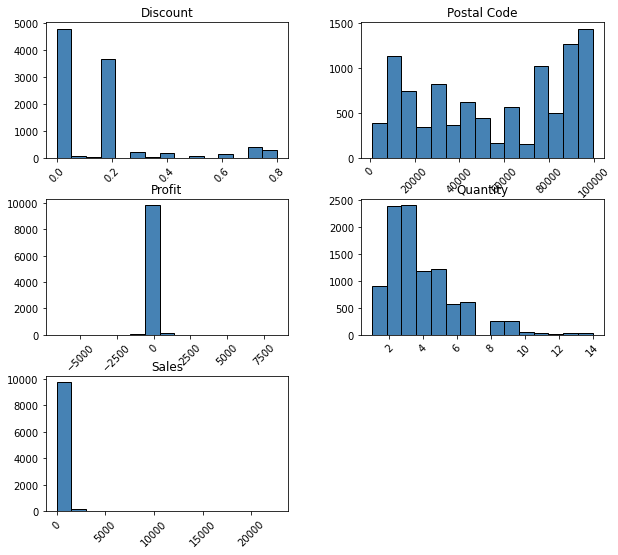

In [10]:
fig = data.hist(bins=15,
                color='steelblue',
                edgecolor='black',
                xlabelsize=10,ylabelsize=10,
                xrot=45,yrot=0,
                figsize=(10,9),
                grid=False)

In [11]:
data['total']=data['Profit'].abs()
data.head()

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,final_stat,total
0,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.9600,2,0.00,41.9136,profit,41.9136
1,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Chairs,731.9400,3,0.00,219.5820,profit,219.5820
2,Second Class,Corporate,United States,Los Angeles,California,90036,West,Office Supplies,Labels,14.6200,2,0.00,6.8714,profit,6.8714
3,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.5775,5,0.45,-383.0310,loss,383.0310
4,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.3680,2,0.20,2.5164,profit,2.5164


*****Visualizing Profit in Various fields*****

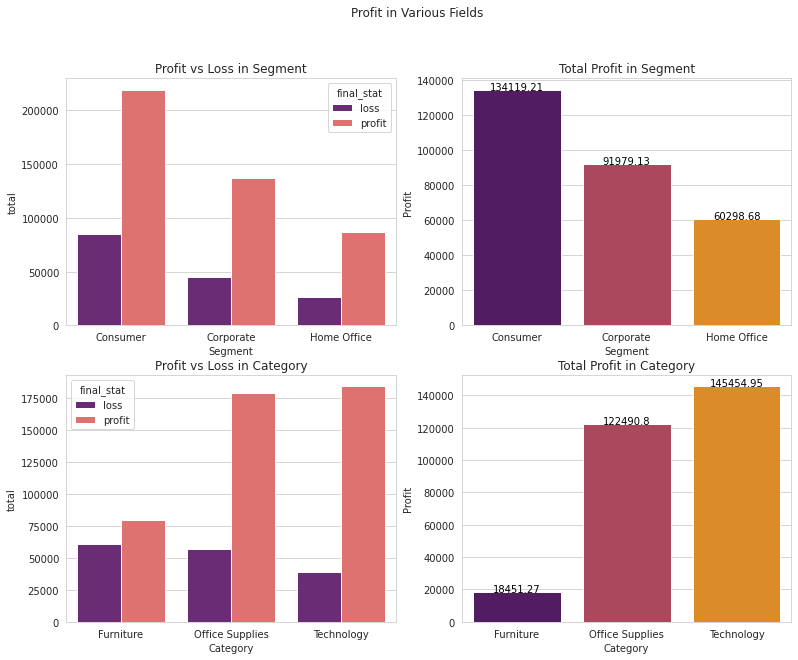

In [39]:
f,axes = plt.subplots(2,2,figsize=(13,10))
f.suptitle('Profit in Various Fields')
df = data.loc[:,['Segment','final_stat','total','Profit']]
df_g = df.groupby(['Segment','final_stat']).sum().reset_index()
sns.barplot(x='Segment' ,y='total',hue='final_stat',data=df_g,palette='magma',ax=axes[0,0]).set_title('Profit vs Loss in Segment')

df_g1 = df.groupby(['Segment']).sum().reset_index()
g = sns.barplot(x='Segment',y='Profit',data=df_g1,ax=axes[0,1],palette='inferno')
g.set_title('Total Profit in Segment')
for index, row in df_g1.iterrows():
  g.text(row.name,row.Profit,round(row.Profit,2),color='black',ha='center')

df1 = data.loc[:,['Category','final_stat','total','Profit']]
df1_g = df1.groupby(['Category','final_stat']).sum().reset_index()
sns.barplot(x='Category',y='total',hue='final_stat',data=df1_g,palette='magma',ax=axes[1,0]).set_title('Profit vs Loss in Category')


df_g1 = df1.groupby(['Category']).sum().reset_index()
g = sns.barplot(x='Category',y='Profit',data=df_g1,ax=axes[1,1],palette='inferno')
g.set_title('Total Profit in Category')
for index, row in df_g1.iterrows():
  g.text(row.name,row.Profit,round(row.Profit,2),color='black',ha='center')


*****Visualizing The Profits In Each Categories*****

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.


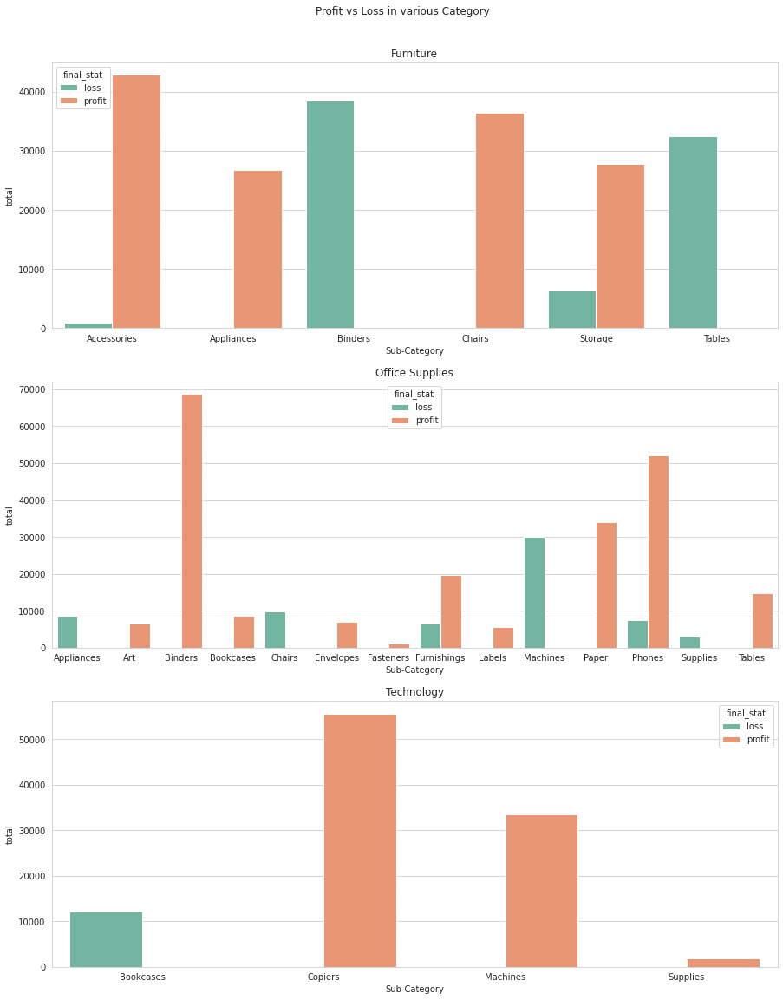

In [60]:
df2 = data.loc[:,['Sub-Category','Category','final_stat','total']]
df2_g = df2.groupby(['Sub-Category','final_stat']).sum().reset_index()
sub = df2['Category'].unique().tolist()
f,(ax0,ax1,ax2)=plt.subplots(3,1,figsize=(15,18))
f.suptitle('Profit vs Loss in various Category')
f.subplots_adjust(top=0.93,wspace=0.3)
ax_x=[ax0,ax1,ax2]
for i in range(3):    
  cols = df2.columns[df2.columns.isin(['Category'])]
  df2_n = df2_g[(df2[cols]==sub[i]).all(1)]
  sns.barplot(x='Sub-Category',y='total',hue='final_stat',data=df2_n,ax=ax_x[i],palette='Set2')
  sns.set_style('whitegrid')
  ax_x[i].set_title(sub[i])

In [14]:
df3 = data.loc[:,['State','final_stat','Profit']]
df3_g = df3.groupby(['State'],as_index=False).sum()
df3_g.head()


,State,Profit
0,Alabama,5786.8253
1,Arizona,-3427.9246
2,Arkansas,4008.6871
3,California,76381.3871
4,Colorado,-6527.8579


*****Visualizing the Profits and Losses in Each State*****

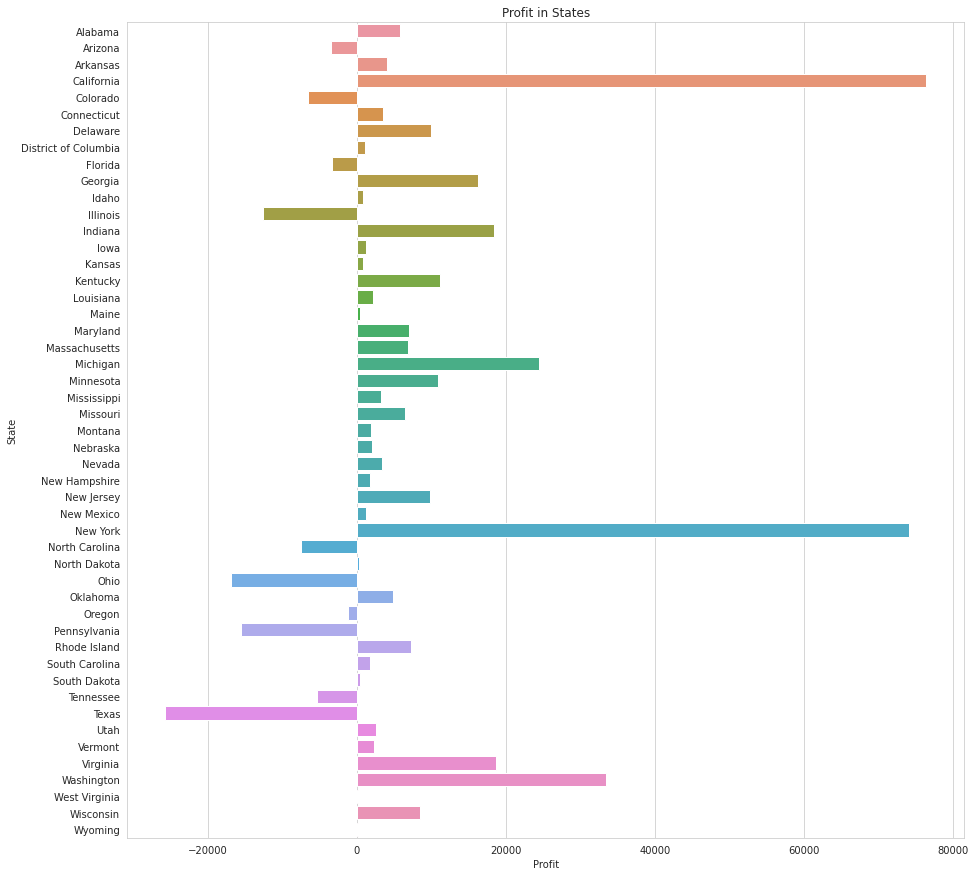

In [70]:
plt.figure(figsize=(15,15))
sns.barplot(x='Profit',y='State',data=df3_g).set_title('Profit in States')
sns.set_style('whitegrid')

*****Visualizing the Sales in Each State*****

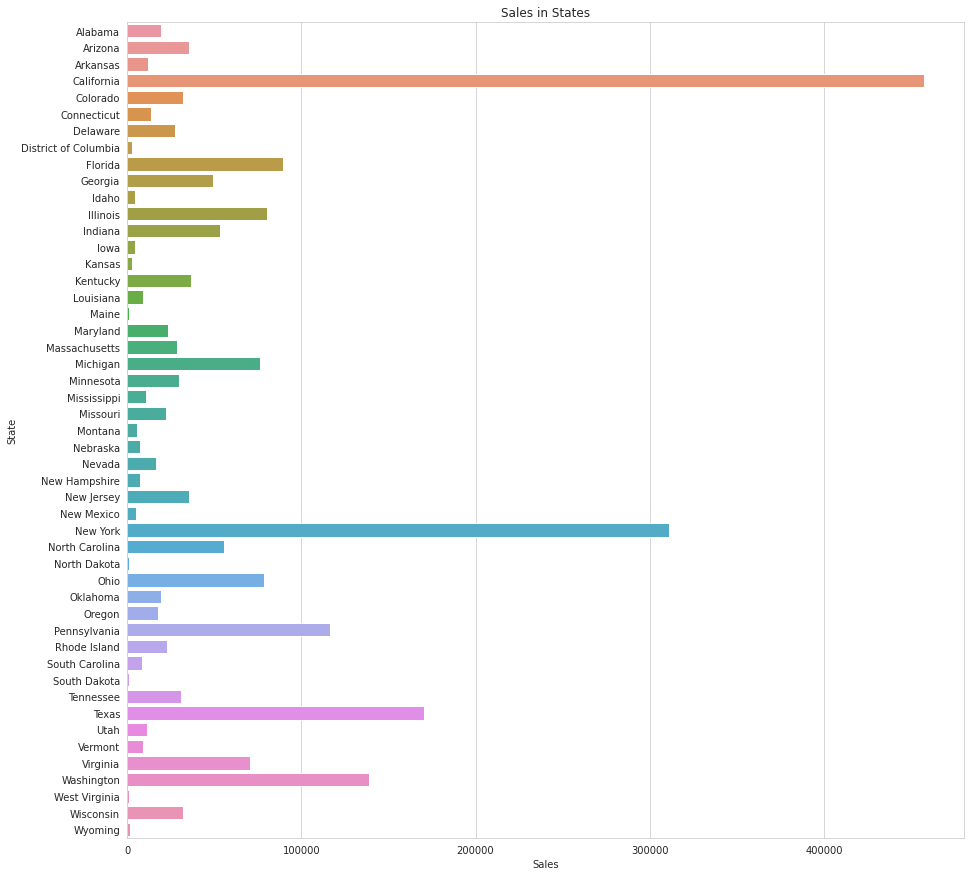

In [16]:
df4 = data.loc[:,['Sales','State']]
df4_g = df4.groupby(['State'],as_index=False).sum()
plt.figure(figsize=(15,15))
sns.barplot(x='Sales',y='State',data=df4_g).set_title('Sales in States')
sns.set_style('whitegrid')

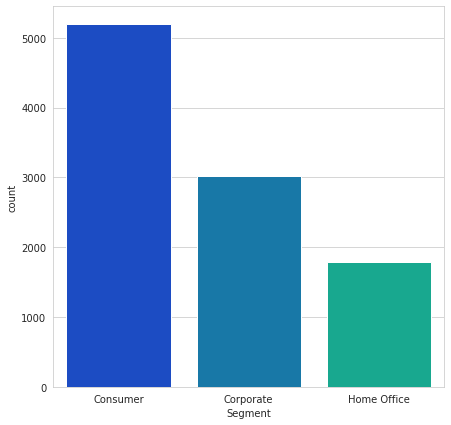

In [141]:
plt.figure(figsize=(7,7))
sns.countplot(x='Segment',data=data,palette='winter')

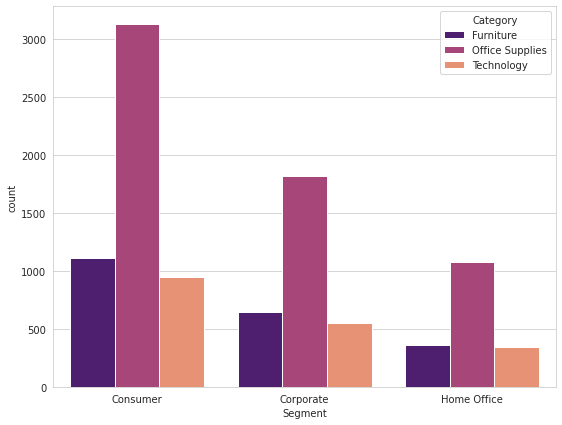

In [143]:
plt.figure(figsize=(9,7))
sns.countplot(x='Segment',hue='Category',data=data,palette='magma')

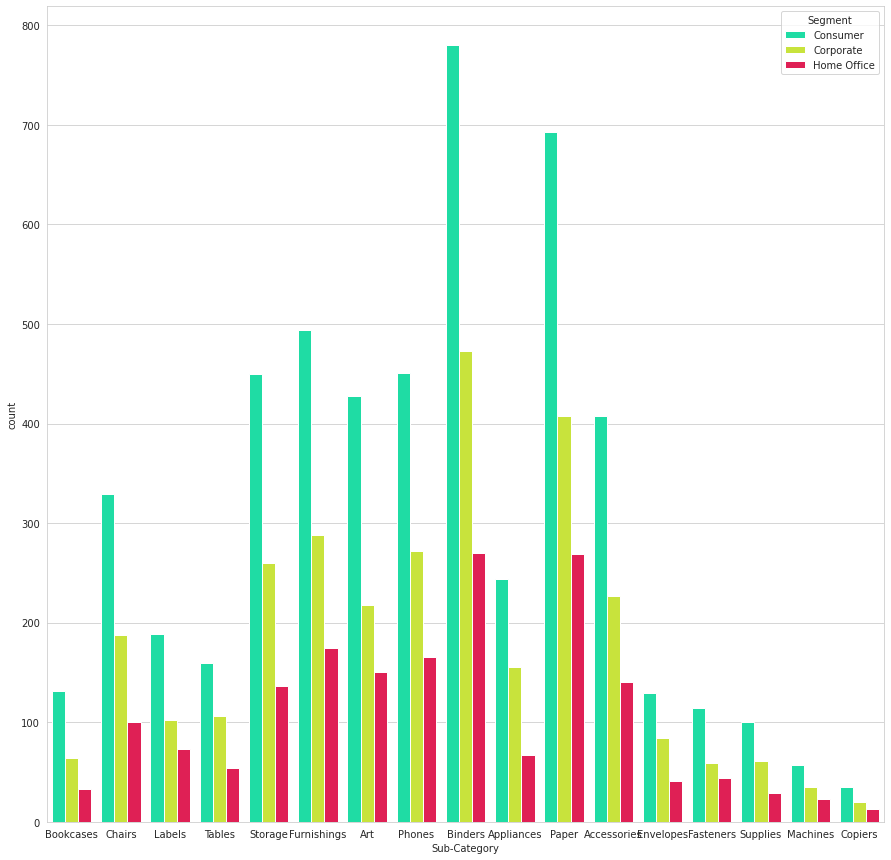

In [158]:
plt.figure(figsize=(15,15))
sns.countplot(x='Sub-Category',hue='Segment',data=data,orient="v",palette='gist_ncar')

**Quantity vs Region**

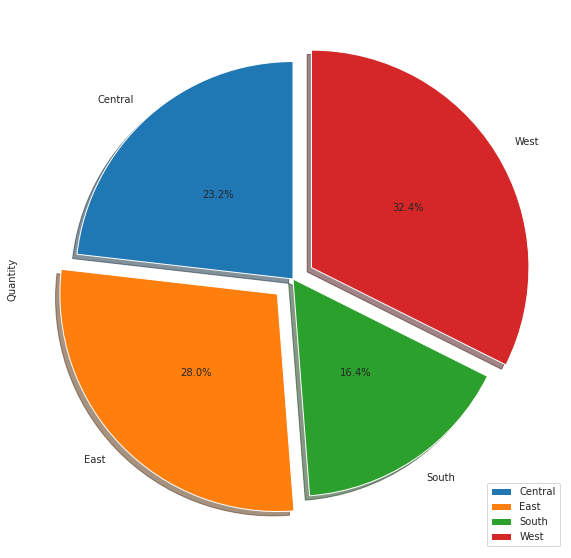

In [86]:
df8 = data.loc[:,['Region','Quantity']]
explode_list = [0, 0.1, 0, 0.1]
df8_g=df8.groupby(['Region']).sum()
df8_g.plot(kind='pie',y='Quantity',
           figsize=(10,10),
           autopct='%1.1f%%',
           startangle=90,
           shadow=True,
           pctdistance=0.52,
           explode=explode_list)

**Category vs Quantity**

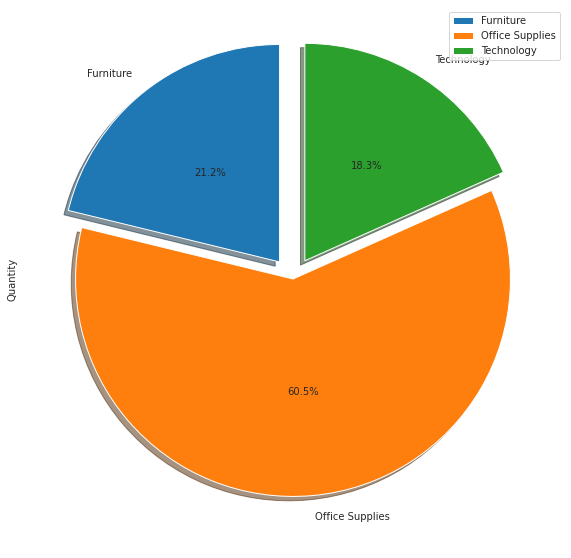

In [110]:
df9 = data.loc[:,['Category','Quantity']]
explode_list1 = [0.1, 0, 0.1]
df9_g=df9.groupby(['Category']).sum()
df9_g.plot(kind='pie',y='Quantity',
           figsize=(10,10),
           autopct='%1.1f%%',
           startangle=90,
           shadow=True,
           pctdistance=0.52,
           explode=explode_list1)

**Sub-Category vs Quantity**

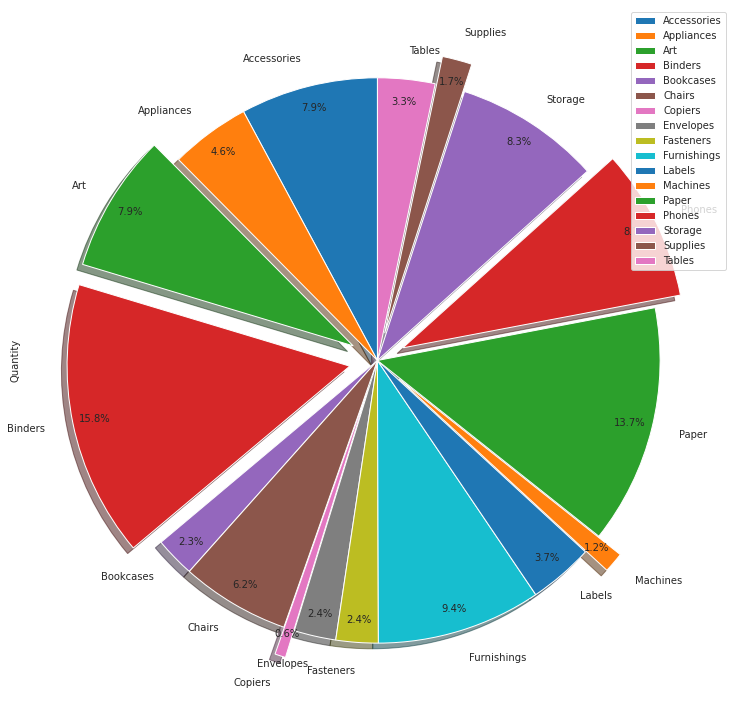

In [123]:
df10 = data.loc[:,['Sub-Category','Quantity']]
explode_list2 = [0, 0, 0.1, 0.1, 0, 0, 0.1, 0, 0, 0, 0, 0.1, 0, 0.1, 0, 0.1, 0]
df10_g=df10.groupby(['Sub-Category']).sum()
df10_g.plot(kind='pie',y='Quantity',
           figsize=(13,13),
           autopct='%1.1f%%',
           startangle=90,
           shadow=True,
           pctdistance=0.92,
           explode=explode_list2
          )

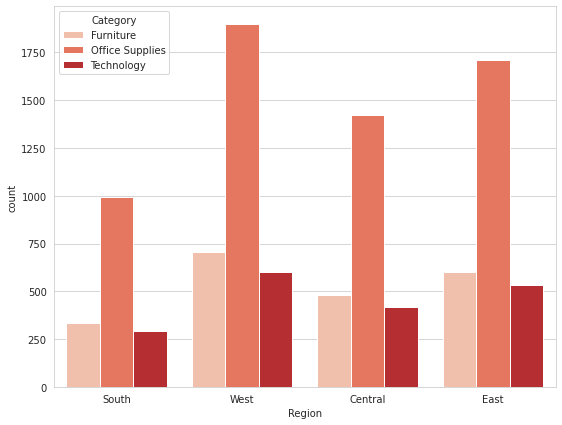

In [136]:
df11 = data.loc[:,['Region','Category','Quantity']]
plt.figure(figsize=(9,7))
sns.countplot(x='Region',hue ='Category',data=df11,palette='Reds')

**Visualizing Choropleth map for sales in US country**

In [16]:
us_geo =r'us1.json'

In [74]:
df5 = data.loc[:,['State','Sales']]
df5_g = df5.groupby(['State']).sum().reset_index()
us_map = folium.Map(location=[37.090240,-95.712891], zoom_start=4)

In [75]:
threshold_scale = np.linspace(df5_g['Sales'].min(),
                              df5_g['Sales'].max(),
                              10, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1
 # make sure that the last value of the list is greater than the maximum immigration

In [76]:
us_map.choropleth(
    geo_data=us_geo,
    data=df5_g,
    columns=['State', 'Sales'],
    key_on='feature.properties.NAME',
    threshold_scale=threshold_scale,
    fill_color='Reds', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Sales',
    reset=True,
)

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [77]:
us_map

**Visualizing the Choropleth Map Based on Profits**

In [88]:
df6 = data.loc[:,['State','final_stat','total']]
df6_n = df6[data['final_stat']=='profit']
df6_g = df6_n.groupby(['State']).sum().reset_index()
us_map_p = folium.Map(location=[37.090240,-95.712891], zoom_start=4)

In [116]:
df6 = data.loc[:,['State','Profit']]
#df6_n = df6[data['final_stat']=='profit']
df6_g = df6.groupby(['State']).sum().reset_index()
df6_g_n = df6_g[df6_g['Profit']>=0]
us_map_p = folium.Map(location=[37.090240,-95.712891], zoom_start=4)

In [96]:
threshold_scale_p = np.linspace(df6_g_n['Profit'].min(),
                              df6_g_n['Profit'].max(),
                              10, dtype=int)
threshold_scale_p = threshold_scale_p.tolist() # change the numpy array to a list
threshold_scale_p[-1] = threshold_scale_p[-1] + 1
 # make sure that the last value of the list is greater than the maximum immigration

In [117]:
us_map_p.choropleth(
    geo_data=us_geo,
    data=df6_g_n,
    columns=['State', 'Profit'],
    key_on='feature.properties.NAME',
    threshold_scale=threshold_scale_p,
    fill_color='YlGn', 
    fill_opacity=0.9, 
    line_opacity=0.2,
    legend_name='Profit',
    reset=True,
)

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [118]:
us_map_p

In the above map showing that States which are getting Profits

In [136]:
df7 = data.loc[:,['State','Profit']]
#df7_n = df7[data['final_stat']=='loss']
df7_g = df7.groupby(['State']).sum().reset_index()
df7_g_n = df7_g[df7_g['Profit']<0]
df7_g_n['Profit'] =df7_g_n['Profit'].abs()
us_map_l = folium.Map(location=[37.090240,-95.712891], zoom_start=4)
df7_g_n.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,State,Profit
1,Arizona,3427.9246
4,Colorado,6527.8579
8,Florida,3399.3017
11,Illinois,12607.8870
31,North Carolina,7490.9122


In [137]:
threshold_scale_l = np.linspace(df7_g_n['Profit'].min(),
                              df7_g_n['Profit'].max(),
                              10, dtype=int)
threshold_scale_l = threshold_scale_l.tolist() # change the numpy array to a list
threshold_scale_l[-1] = threshold_scale_l[-1] + 1
 # make sure that the last value of the list is greater than the maximum immigration

In [138]:
us_map_l.choropleth(
    geo_data=us_geo,
    data=df7_g_n,
    columns=['State', 'Profit'],
    key_on='feature.properties.NAME',
    threshold_scale=threshold_scale_l,
    fill_color='BuGn', 
    fill_opacity=0.9, 
    line_opacity=0.2,
    legend_name='loss',
    reset=True
)

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [139]:
us_map_l

In the above map shows that States which are getting loss